<a href="https://colab.research.google.com/github/dharshinivenki/Drinking-Water-Potability/blob/main/WATER_POTABILITY_DHARS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import cufflinks
import warnings
warnings.filterwarnings('ignore')

#PREPROCESSING LIBRARIES:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer

#MACHINE LEARNING MODEL LIBRARIES:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn import tree
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

#METRICS LIBRARIES:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

In [ ]:
data=pd.read_csv("drinking_water_potability.csv")
data

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890456,20791.31898,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.05786,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.54173,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.41744,8.059332,356.886136,363.266516,18.436525,100.341674,4.628771,0
4,9.092223,181.101509,17978.98634,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681736,47580.99160,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.80216,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.57822,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.86938,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


In [ ]:
data.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [ ]:
# data.info() use to see null values,data types of columns, shape of data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
#data.describe() is used to see the summary of the dataset
data.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690300,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833605,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762125,8.114887,359.950170,481.792305,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196010,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [ ]:
# uniques values in every column
data.nunique()

ph                 2785
Hardness           3276
Solids             3276
Chloramines        3276
Sulfate            2495
Conductivity       3276
Organic_carbon     3276
Trihalomethanes    3114
Turbidity          3276
Potability            2
dtype: int64

In [ ]:
#shape of the data
data.shape

(3276, 10)

In [ ]:
#A Box Plot is also known as Whisker plot is created to display the summary of the set
#of data values having properties like minimum, first quartile, median, third quartile and maximum. 
#In the box plot, a box is created from the first quartile to the third quartile, a vertical line
#is also there which goes through the box at the median. Here x-axis denotes the data to be plotted while 
#the y-axis shows the frequency distribution.

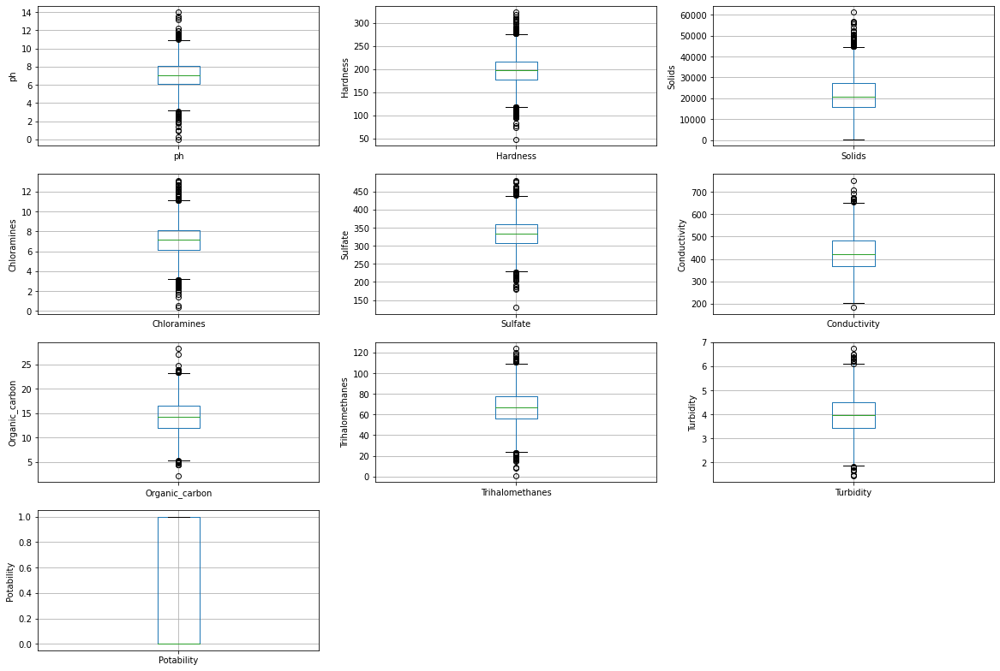

In [ ]:
plt.figure(figsize=(20,50))
for i,col in enumerate(data,1):
    plt.subplot(14,3,i)
    data.boxplot([col])
    plt.ylabel(col)
plt.show()

<AxesSubplot:>

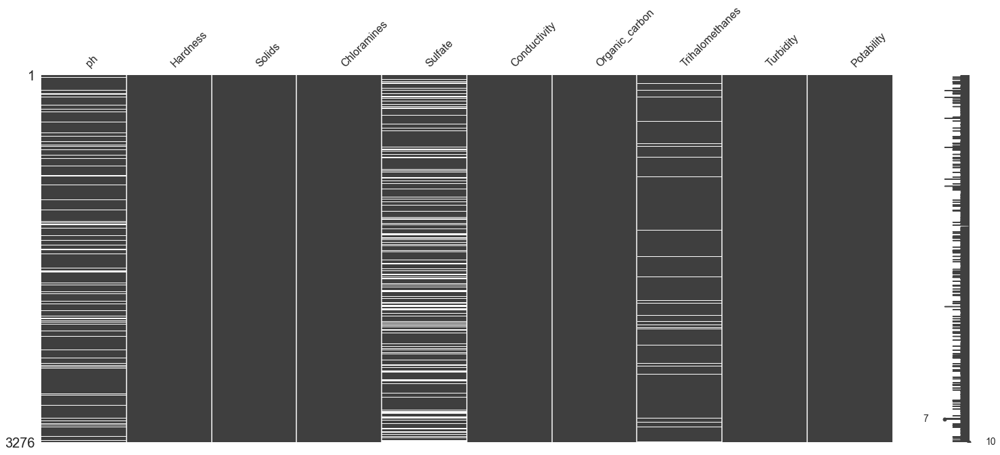

In [ ]:
import missingno as msng
msng.matrix(data)

In [ ]:
data.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [ ]:
data.dropna(inplace=True,axis=0)

<AxesSubplot:>

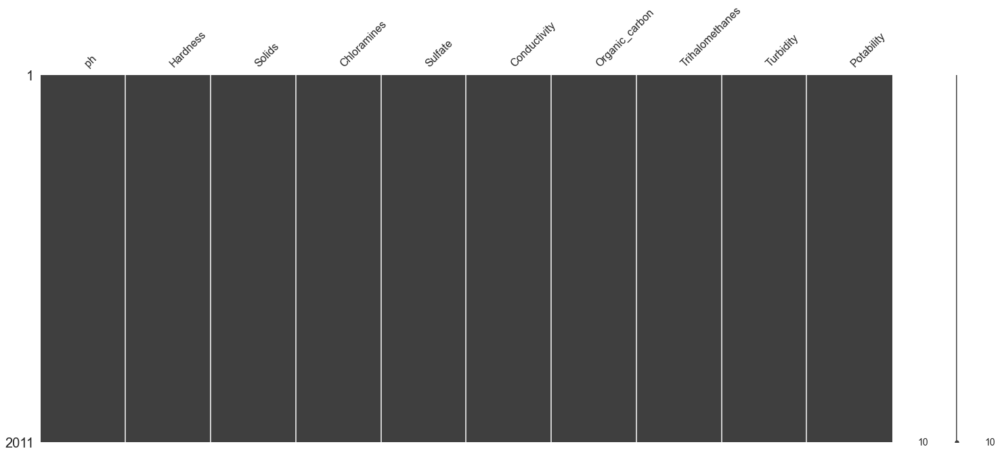

In [ ]:
import missingno as msng
msng.matrix(data)

In [ ]:
#correlation

In [ ]:
data_corr=data.corr()
data_corr

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.082096,-0.089288,-0.034350,0.018203,0.018614,0.043503,0.003354,-0.039057,-0.003556
Hardness,0.082096,1.000000,-0.046899,-0.030054,-0.106923,-0.023915,0.003610,-0.013013,-0.014449,-0.013837
Solids,-0.089288,-0.046899,1.000000,-0.070148,-0.171804,0.013831,0.010242,-0.009143,0.019546,0.033743
Chloramines,-0.034350,-0.030054,-0.070148,1.000000,0.027244,-0.020486,-0.012653,0.017084,0.002363,0.023779
Sulfate,0.018203,-0.106923,-0.171804,0.027244,1.000000,-0.016121,0.030831,-0.030274,-0.011187,-0.023577
Conductivity,0.018614,-0.023915,0.013831,-0.020486,-0.016121,1.000000,0.020966,0.001285,0.005798,-0.008128
Organic_carbon,0.043503,0.003610,0.010242,-0.012653,0.030831,0.020966,1.000000,-0.013274,-0.027308,-0.030001
Trihalomethanes,0.003354,-0.013013,-0.009143,0.017084,-0.030274,0.001285,-0.013274,1.000000,-0.022145,0.007130
Turbidity,-0.039057,-0.014449,0.019546,0.002363,-0.011187,0.005798,-0.027308,-0.022145,1.000000,0.001581
Potability,-0.003556,-0.013837,0.033743,0.023779,-0.023577,-0.008128,-0.030001,0.007130,0.001581,1.000000


<AxesSubplot:>

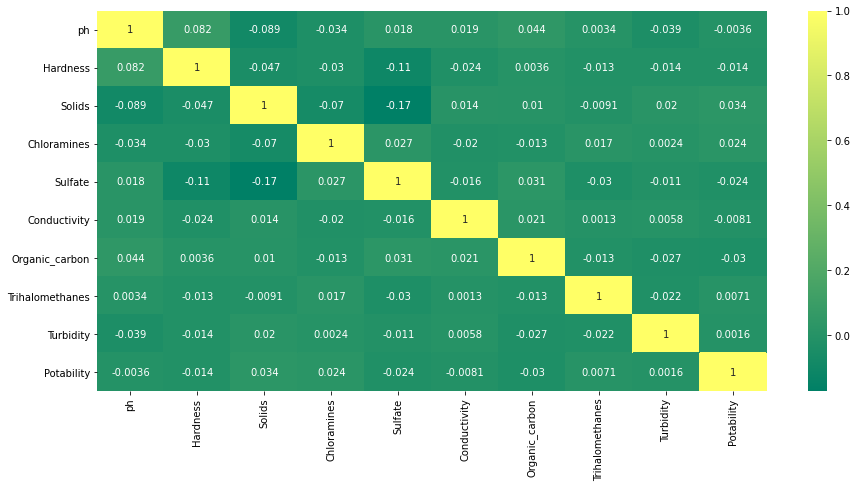

In [ ]:
plt.figure(figsize=(15,7))
sns.heatmap(data_corr,annot=True,cmap='summer')

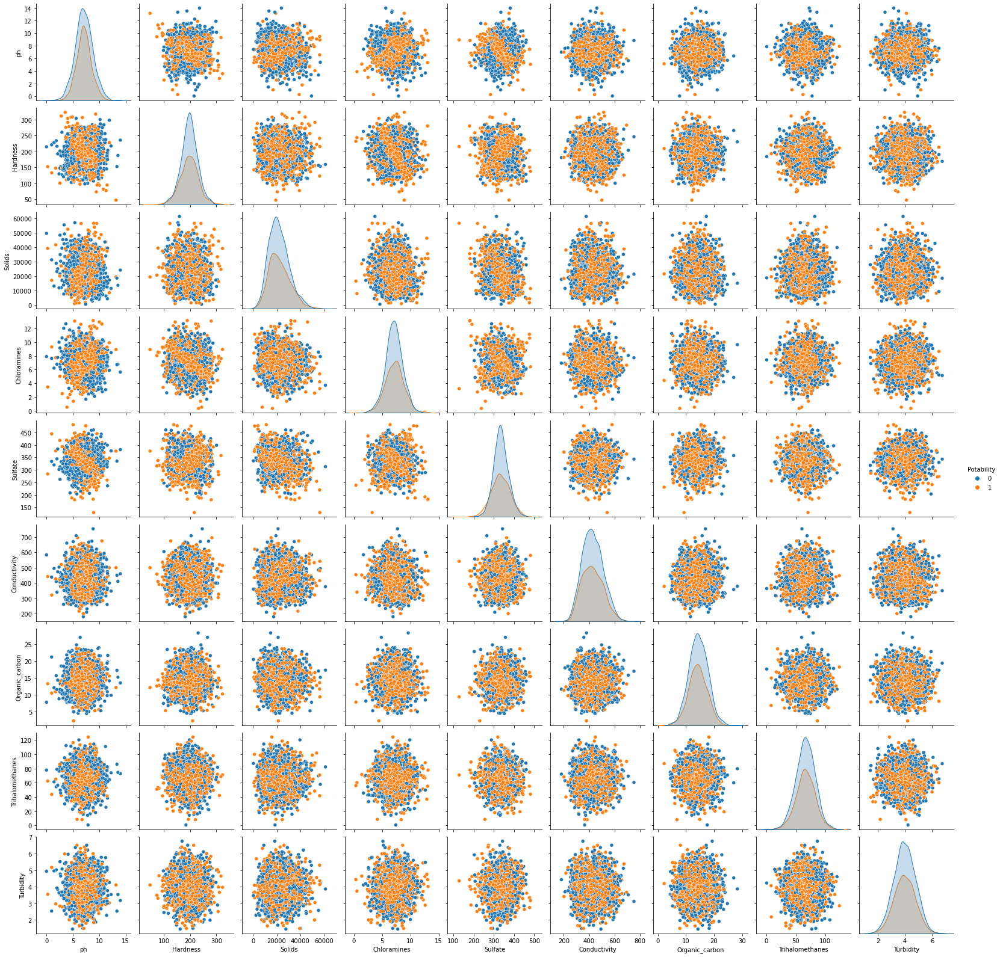

In [ ]:
sns.pairplot(data=data,hue='Potability')

In [ ]:
#visualization

0    1200
1     811
Name: Potability, dtype: int64

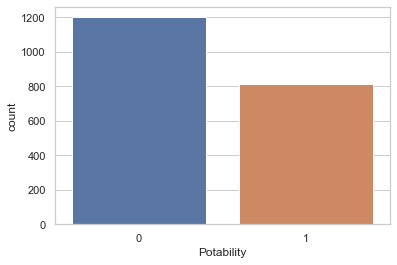

In [ ]:
# check dataset is balanced or imbalnced
sns.countplot(data=data,x=data.Potability)
data.Potability.value_counts()

<AxesSubplot:xlabel='Conductivity', ylabel='Turbidity'>

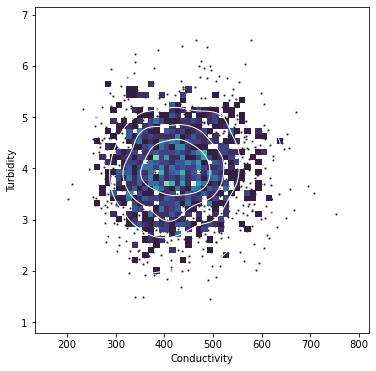

In [ ]:
f, ax = plt.subplots(figsize=(6, 6))
sns.scatterplot(data=data,x='Conductivity', y='Turbidity', s=5, color=".15")
sns.histplot(data=data,x='Conductivity', y='Turbidity', bins=50, pthresh=.1, cmap="mako")
sns.kdeplot(data=data,x='Conductivity', y='Turbidity', levels=5, color="w", linewidths=1)

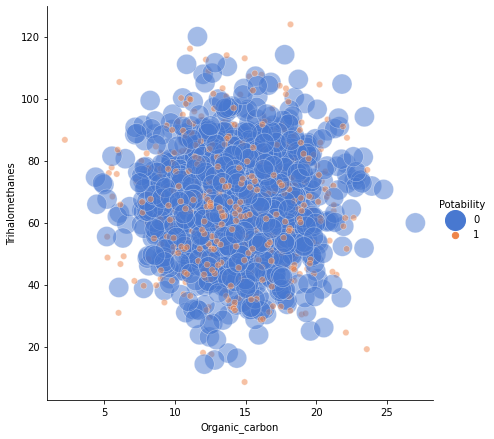

In [ ]:
sns.relplot(x="Organic_carbon", y="Trihalomethanes", hue="Potability", size="Potability",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=data)

<AxesSubplot:xlabel='Hardness', ylabel='Sulfate'>

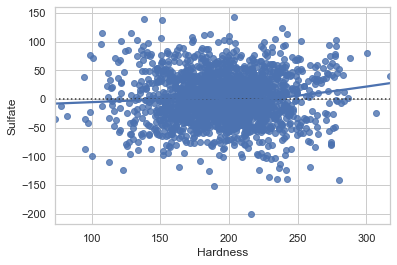

In [ ]:
sns.set_theme(style="whitegrid")
sns.residplot(data=data,x='Hardness', y='Sulfate', lowess=True, color="b")

<AxesSubplot:xlabel='Chloramines', ylabel='ph'>

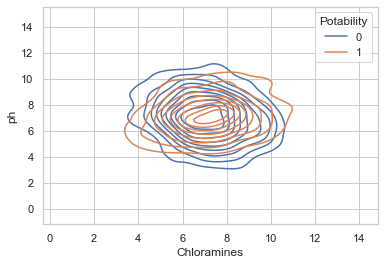

In [ ]:
sns.kdeplot(
    data=data,
    x="Chloramines",
    y="ph",
    hue="Potability",
    thresh=.1,
)

In [ ]:
#PLOTTY PLOTS

In [ ]:
import plotly.express as px

fig = px.strip(data, x="ph", y="Hardness")
fig.show()

In [ ]:
import plotly.express as px
fig = px.scatter_ternary(data, a="Hardness", b="Organic_carbon", c="Sulfate")
fig.show()

In [ ]:
import plotly.express as px
fig = px.scatter_ternary(data, a="Trihalomethanes", b="Turbidity", c="Chloramines")
fig.show()

In [ ]:
import plotly.express as px
df = px.data.iris()
fig = px.parallel_coordinates(data, color="Potability", labels={'ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability',},
                             color_continuous_scale=px.colors.diverging.Tealrose,
                             color_continuous_midpoint=2)
fig.show()

In [ ]:
import plotly.express as px

fig = px.pie(data, values='ph', names='Potability')
fig.show()

In [ ]:
x_ind= data.drop(['Potability'],axis=1)

In [ ]:
y_dep=data.Potability

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x_ind, y_dep, test_size = 0.2, random_state =1)

In [ ]:
!pip install imblearn

In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
SMT=SMOTE()

In [ ]:
x_train_sm,y_train_sm=SMT.fit_resample(x_train,y_train)

In [ ]:
from collections import Counter
Counter(y_train_sm)

Counter({0: 947, 1: 947})

In [ ]:
Counter(y_train)

Counter({0: 947, 1: 661})

In [ ]:
x_train_sm=x_train
y_train_sm=y_train


In [ ]:
# LOGISTIC REGRESSION

In [ ]:
import statsmodels.api as sm

In [ ]:
model_stat=sm.Logit(y_train,x_train).fit()

Optimization terminated successfully.
         Current function value: 0.674567
         Iterations 4


In [ ]:
model_stat.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
================================================================
Model:              Logit            Pseudo R-squared: 0.004    
Dependent Variable: Potability       AIC:              2187.4084
Date:               2021-11-27 16:52 BIC:              2235.8531
No. Observations:   1608             Log-Likelihood:   -1084.7  
Df Model:           8                LL-Null:          -1089.0  
Df Residuals:       1599             LLR p-value:      0.37597  
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     4.0000                                      
----------------------------------------------------------------
                   Coef.  Std.Err.    z    P>|z|   [0.025 0.975]
----------------------------------------------------------------
ph                -0.0052   0.0319 -0.1620 0.8713 -0.0678 0.0574
Hardness          -0.0013   0.0014 -0.8908 0.3730 -0.0040 0.0015
Solids             0.0000   0.0000  2.1759 0.0296  0.0000 0.0000
Chloramines        0.0324   0.0303  1.0680 0.2855 -0.0271 0.0918
Sulfate           -0.0010   0.0010 -0.9833 0.3255 -0.0030 0.0010
Conductivity      -0.0007   0.0006 -1.2027 0.2291 -0.0019 0.0005
Organic_carbon    -0.0118   0.0148 -0.7991 0.4242 -0.0409 0.0172
Trihalomethanes   -0.0006   0.0030 -0.1837 0.8542 -0.0065 0.0054
Turbidity          0.0691   0.0615  1.1227 0.2616 -0.0515 0.1897
================================================================

"""

In [ ]:
from sklearn.linear_model import LogisticRegression
model1=LogisticRegression()

In [ ]:
model1.fit(x_train,y_train)

LogisticRegression()

In [ ]:
y_pred_log=model1.predict(x_test)
y_pred_log
confusion_matrix(y_test,y_pred_log)
acc=accuracy_score(y_test,y_pred_log)*100
acc


63.52357320099256

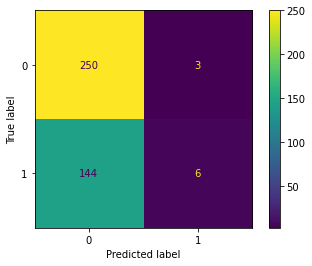

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(model1,x_test,y_test)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_log))

              precision    recall  f1-score   support

           0       0.63      0.99      0.77       253
           1       0.67      0.04      0.08       150

    accuracy                           0.64       403
   macro avg       0.65      0.51      0.42       403
weighted avg       0.65      0.64      0.51       403



In [ ]:
# KNN MODEL

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
KNN=KNeighborsClassifier(n_neighbors=43,p=2,metric='euclidean')

In [ ]:
from sklearn.preprocessing import StandardScaler
norm=StandardScaler()
x_train=norm.fit_transform(x_train)
x_test=norm.fit_transform(x_test)

In [ ]:
# check p value in model building 
y_dep.value_counts()

0    1200
1     811
Name: Potability, dtype: int64

In [ ]:
data.shape

(2011, 10)

In [ ]:
np.sqrt(2011)

44.844174649557324

In [ ]:
KNN=KNN.fit(x_train,y_train)
y_pred_KNN=KNN.predict(x_test)
confusion_matrix(y_test,y_pred_KNN)
acc=accuracy_score(y_test,y_pred_KNN)*100
acc

68.23821339950372

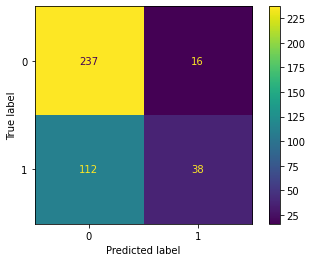

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
plot_confusion_matrix(KNN,x_test,y_test)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_KNN))

              precision    recall  f1-score   support

           0       0.68      0.94      0.79       253
           1       0.70      0.25      0.37       150

    accuracy                           0.68       403
   macro avg       0.69      0.60      0.58       403
weighted avg       0.69      0.68      0.63       403



In [ ]:
# USING ERROR RATE METHOD

In [ ]:
error_rate=[]
for i in range(1,60):
    knn_new=KNeighborsClassifier(n_neighbors=i)
    knn_new.fit(x_train,y_train)
    y_pred_er=knn_new.predict(x_test)
    error_rate.append(np.mean(y_pred_er !=y_test))

Text(0, 0.5, 'Error_rate')

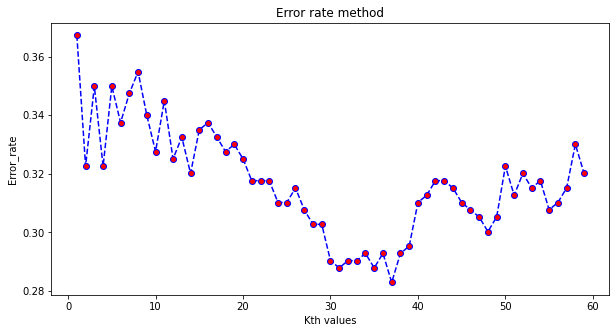

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(range(1,60),error_rate,color='blue',linestyle='dashed',
        marker='o',markerfacecolor='red')
plt.title("Error rate method")
plt.xlabel("Kth values")
plt.ylabel("Error_rate")

In [ ]:
KNN1=KNeighborsClassifier(n_neighbors=37,p=2,metric='euclidean')
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
KNN1=KNN1.fit(x_train,y_train)

In [ ]:
KNN1 =  KNN1.fit(x_train, y_train)
y_pred_KNN1= KNN1.predict(x_test)
accuracy_score(y_test, y_pred_KNN1)*100

71.712158808933

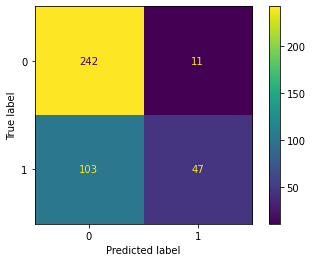

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
plot_confusion_matrix(KNN1,x_test,y_test)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_KNN1))

              precision    recall  f1-score   support

           0       0.70      0.96      0.81       253
           1       0.81      0.31      0.45       150

    accuracy                           0.72       403
   macro avg       0.76      0.63      0.63       403
weighted avg       0.74      0.72      0.68       403



In [ ]:
# SVM

In [ ]:
from sklearn.svm import SVC
model_svc=SVC(kernel='rbf')
model_svc.fit(x_train,y_train)

SVC()

In [ ]:
y_pred_svc=model_svc.predict(x_test)
confusion_matrix(y_test,y_pred_svc)
acc=accuracy_score(y_test,y_pred_svc)*100
acc

71.21588089330024

In [ ]:
model_svc.n_support_

array([661, 602])

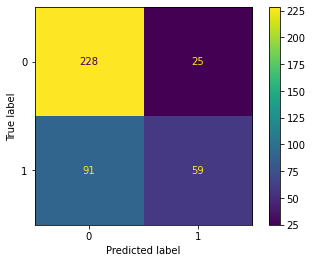

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
plot_confusion_matrix(model_svc,x_test,y_test)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_svc))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       253
           1       0.00      0.00      0.00       150

    accuracy                           0.63       403
   macro avg       0.31      0.50      0.39       403
weighted avg       0.39      0.63      0.48       403



In [ ]:
#Hyper Parameter Tuning For Support Vector Machine

In [ ]:
kernel=['linear','rbf','poly','sigmoid']
for i in kernel:
    model1=SVC(kernel=i)
    model1=model1.fit(x_train,y_train)
    print("Kernel: ", i)
    print("Acc score: " , accuracy_score(y_test,model1.predict(x_test)))

Kernel:  linear
Acc score:  0.6277915632754343
Kernel:  rbf
Acc score:  0.7121588089330024
Kernel:  poly
Acc score:  0.6550868486352357
Kernel:  sigmoid
Acc score:  0.56575682382134


In [ ]:
#Choosing best kernel as rbf

In [ ]:
from sklearn.svm import SVC
model_svc=SVC(kernel='rbf')
model_svc.fit(x_train,y_train)

SVC()

In [ ]:
y_pred_svc=model_svc.predict(x_test)
confusion_matrix(y_test,y_pred_svc)
acc=accuracy_score(y_test,y_pred_svc)*100
acc

71.21588089330024

In [ ]:
# graph

In [ ]:
# NAIVE BAYES ALGORITHM

In [ ]:
from sklearn.naive_bayes import GaussianNB
model=GaussianNB()
model.fit(x_train,y_train)

GaussianNB()

In [ ]:
y_pred_NB= model.predict(x_test)
confusion_matrix(y_test,y_pred_NB)
acc=accuracy_score(y_test,y_pred_NB)*100
acc

61.29032258064516

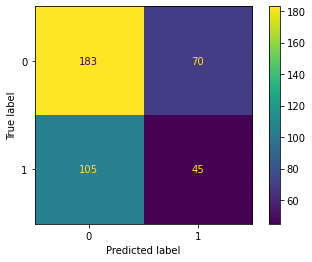

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
plot_confusion_matrix(model1,x_test,y_test)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_NB))

              precision    recall  f1-score   support

           0       0.65      0.83      0.73       253
           1       0.46      0.25      0.32       150

    accuracy                           0.61       403
   macro avg       0.56      0.54      0.53       403
weighted avg       0.58      0.61      0.58       403



In [ ]:
# ADA BOOST

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model_ada=AdaBoostClassifier(random_state=1)
model_ada.fit(x_train,y_train)

AdaBoostClassifier(random_state=1)

In [ ]:
y_pred_ada=model_ada.predict(x_test)
confusion_matrix(y_pred_ada,y_test)
acc=accuracy_score(y_pred_ada,y_test)*100
acc

61.04218362282878

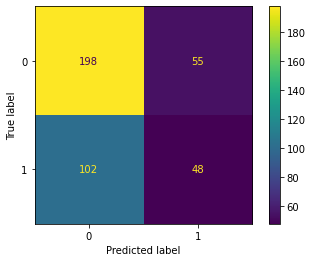

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
plot_confusion_matrix(model_ada,x_test,y_test)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_ada))

              precision    recall  f1-score   support

           0       0.66      0.78      0.72       253
           1       0.47      0.32      0.38       150

    accuracy                           0.61       403
   macro avg       0.56      0.55      0.55       403
weighted avg       0.59      0.61      0.59       403



In [ ]:
# XG-BOOST

In [ ]:
from xgboost import XGBClassifier
model_XG=XGBClassifier(random_state=2)
model_XG.fit(x_train,y_train)

[13:21:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=2,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [ ]:
y_pred_XG=model_XG.predict(x_test)
confusion_matrix(y_pred_XG,y_test)
acc=accuracy_score(y_pred_XG,y_test)*100
acc

65.2605459057072

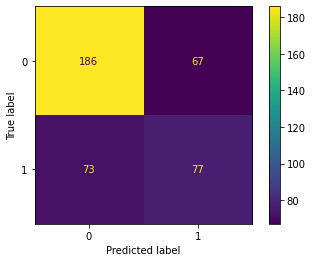

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
plot_confusion_matrix(model_XG,x_test,y_test)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_XG))

              precision    recall  f1-score   support

           0       0.72      0.74      0.73       253
           1       0.53      0.51      0.52       150

    accuracy                           0.65       403
   macro avg       0.63      0.62      0.63       403
weighted avg       0.65      0.65      0.65       403



In [ ]:
# DECISION TREE CLASSIFIER
from sklearn import tree
model=tree.DecisionTreeClassifier(random_state=2)

model=model.fit(x_train,y_train)

y_pred=model.predict(x_test)
confusion_matrix(y_test,y_pred)
acc=accuracy_score(y_test,y_pred)*100
acc

60.049627791563275

In [ ]:
from six import StringIO
from sklearn.tree import export_graphviz
import IPython
from IPython.display import Image
import pydotplus

In [ ]:
my_graph=StringIO()

In [ ]:
export_graphviz(model,out_file=my_graph,filled=True)

In [ ]:
graph=pydotplus.graph_from_dot_data(my_graph.getvalue())

In [ ]:
graph.write_jpg("Decision_Tree.jpg")

True

In [ ]:
Image(graph.create_jpg())

In [ ]:
# decision tree model using Entropy
model_E=tree.DecisionTreeClassifier(criterion="entropy",random_state=2)
model_E=model_E.fit(x_train,y_train)
y_pred_e=model_E.predict(x_test)
confusion_matrix(y_test,y_pred_e)
acc=accuracy_score(y_test,y_pred_e)*100
acc

65.50868486352357

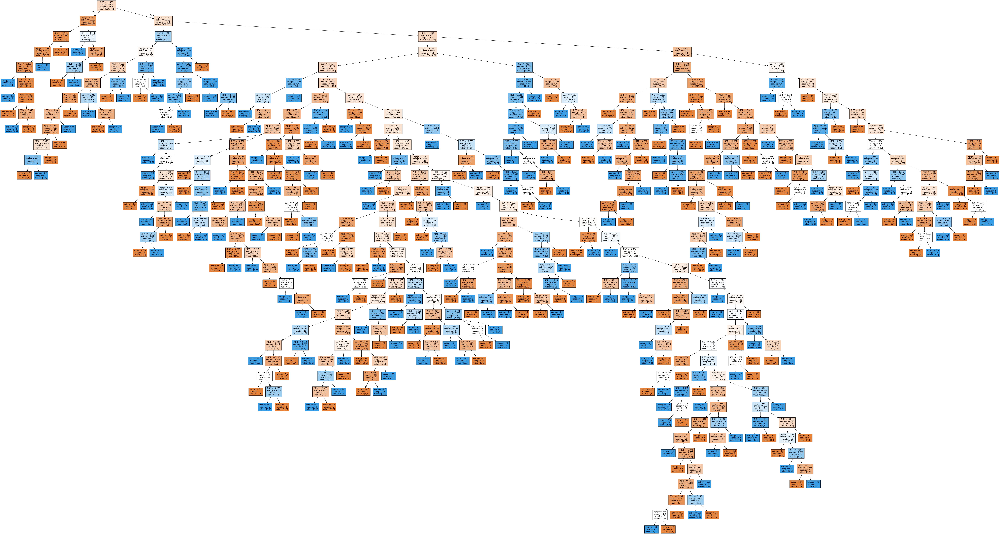

In [ ]:
my_graph=StringIO()
export_graphviz(model_E,out_file=my_graph,filled=True)
graph=pydotplus.graph_from_dot_data(my_graph.getvalue())
Image(graph.create_jpg())

In [ ]:
# HYPER-PARA METRE TUNING

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
parameters={"max_depth":(10,20,30,40,50,60,70,100),'criterion':('gini','entropy'),
            'max_features':('log2','auto','sqrt'),'min_samples_split':(2,4,6)}

In [ ]:
DT_hp=RandomizedSearchCV(tree.DecisionTreeClassifier(),param_distributions=parameters,cv=5)

In [ ]:
DT_hp.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ('gini', 'entropy'),
                                        'max_depth': (10, 20, 30, 40, 50, 60,
                                                      70, 100),
                                        'max_features': ('log2', 'auto',
                                                         'sqrt'),
                                        'min_samples_split': (2, 4, 6)})

In [ ]:
DT_hp.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=10, max_features='sqrt',
                       min_samples_split=6)

In [ ]:
model_after_Ht=tree.DecisionTreeClassifier(criterion='gini', max_depth=20, max_features='log2')

In [ ]:
model_after_Ht=model_after_Ht.fit(x_train,y_train)
y_pred_after_hp=model_after_Ht.predict(x_test)
confusion_matrix(y_test,y_pred_after_hp)
acc=accuracy_score(y_test,y_pred_after_hp)*100
acc

61.53846153846154

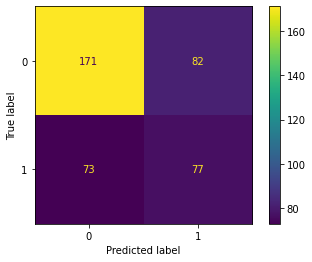

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
plot_confusion_matrix(model_after_Ht,x_test,y_test)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_after_hp))

              precision    recall  f1-score   support

           0       0.70      0.68      0.69       253
           1       0.48      0.51      0.50       150

    accuracy                           0.62       403
   macro avg       0.59      0.59      0.59       403
weighted avg       0.62      0.62      0.62       403



In [ ]:
# RANDOM FOREST CLASSIFIER

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model_RF=RandomForestClassifier(random_state=2)
model_RF.fit(x_train,y_train)

RandomForestClassifier(random_state=2)

In [ ]:
y_pred_RF=model_RF.predict(x_test)
confusion_matrix(y_test,y_pred_RF)
acc=accuracy_score(y_test,y_pred_RF)*100
acc

69.97518610421837

In [ ]:
# HYPERPARAMETER TUNING

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
parameters={"n_estimators":(200,300,400,500,600,7000),"criterion":("gini","entropy"),
            'max_features':('log2','auto','sqrt'),'min_samples_split':(2,4,6),"random_state":(0,1,2)}

In [ ]:
RS_hp=RandomizedSearchCV(RandomForestClassifier(),param_distributions=parameters,cv=5,random_state=2)

In [ ]:
RS_hp.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'criterion': ('gini', 'entropy'),
                                        'max_features': ('log2', 'auto',
                                                         'sqrt'),
                                        'min_samples_split': (2, 4, 6),
                                        'n_estimators': (200, 300, 400, 500,
                                                         600, 7000),
                                        'random_state': (0, 1, 2)},
                   random_state=2)

In [ ]:
RS_hp.best_estimator_

RandomForestClassifier(criterion='entropy', min_samples_split=4,
                       n_estimators=200, random_state=0)

In [ ]:
model_after_Ht=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=2, verbose=0,
                       warm_start=False)

In [ ]:
model_after_Ht=model_after_Ht.fit(x_train,y_train)

In [ ]:
y_pred_RF_hp=model_RF.predict(x_test)
confusion_matrix(y_test,y_pred_RF_hp)
acc=accuracy_score(y_test,y_pred_RF_hp)*100
acc

69.97518610421837

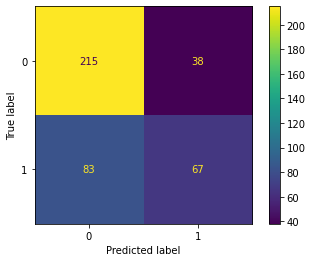

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
plot_confusion_matrix(model_RF,x_test,y_test)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_RF_hp))

              precision    recall  f1-score   support

           0       0.72      0.85      0.78       253
           1       0.64      0.45      0.53       150

    accuracy                           0.70       403
   macro avg       0.68      0.65      0.65       403
weighted avg       0.69      0.70      0.69       403



In [ ]:
models_acc = []
models = {
    'Logistic Regression' : LogisticRegression(),
    'KNeighbors' : KNeighborsClassifier(),
    'SVM' : SVC(),
    'Decision Tree': tree.DecisionTreeClassifier(),
    'Naive Bayes' : GaussianNB(),
    'Random Forest': RandomForestClassifier(), 
    'Ada Boost' : AdaBoostClassifier(),
    'XG Boost': XGBClassifier()    
}
for name, model in models.items():
    model.fit(x_train, y_train)
    print(name + ' trained!')
    pred = model.predict(x_test)
    
    ''' appending result to model_acc'''
    models_acc.append(accuracy_score(y_test, pred))

Logistic Regression trained!
KNeighbors trained!
SVM trained!
Decision Tree trained!
Naive Bayes trained!
Random Forest trained!
Ada Boost trained!
[13:41:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XG Boost trained!


In [ ]:
res = pd.DataFrame({
    'Model Accuracy': models_acc, 
    "Model Name": ['LogisticRegression', 'KNeighborsClassifier', 'SVM', 'Decision Tree', 'Naive Bayes','Random Forest'
                  ,'AdaBoost','XG Boost']
})

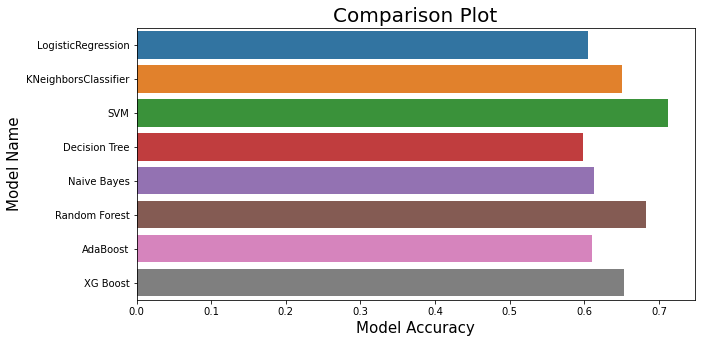

In [ ]:
plt.figure(figsize=(10, 5))
sns.barplot(res['Model Accuracy'], res['Model Name'])
plt.title('Comparison Plot',fontsize=20)
plt.xlabel('Model Accuracy', fontsize=15)
plt.ylabel('Model Name', fontsize=15);